In [1]:
!apt-get install unrar

# Upgrade pip (optional, but recommended)
!pip install --upgrade pip

# Install PyTorch. Colab usually has PyTorch pre-installed.
!pip install torch torchvision

# Install Hugging Face Transformers
!pip install transformers

# Install the PEFT library for parameter-efficient fine-tuning
!pip install peft

# Install the Hugging Face Datasets library
!pip install datasets

# Install the Evaluate library for computing metrics
!pip install evaluate

# Install Pillow (for working with images)
!pip install Pillow

# (Optional) Install NumPy if not installed - Colab comes with it pre-installed.
!pip install numpy

!pip install rouge_score
!pip install evaluate
!pip install clip-score


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.7 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 156.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 146.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 132.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 156.3 MB/s eta 0:00:

In [2]:
#dataset
! gdown --id 1tOQTqYzCMRKGu1odehjFa0N11o1cbvKQ

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1tOQTqYzCMRKGu1odehjFa0N11o1cbvKQ
To: /content/test-00000-of-00001.parquet
100% 96.3M/96.3M [00:01<00:00, 70.0MB/s]


In [3]:
! gdown --id 1iT_rNX6A_Q0Zp2SaQEbAh-Lp9379rEnx

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1iT_rNX6A_Q0Zp2SaQEbAh-Lp9379rEnx
From (redirected): https://drive.google.com/uc?id=1iT_rNX6A_Q0Zp2SaQEbAh-Lp9379rEnx&confirm=t&uuid=71e643b6-a6e7-4ba0-ab69-d30c99fba1fe
To: /content/Alharthi_Reduced2_Lora_instructblip-advanced-finetized-final.zip
100% 583M/583M [00:06<00:00, 89.2MB/s]


In [6]:


!unzip Alharthi_Reduced2_Lora_instructblip-advanced-finetized-final.zip -d Alharthi_Reduced2_Lora


Archive:  Alharthi_Reduced2_Lora_instructblip-advanced-finetized-final.zip
   creating: Alharthi_Reduced2_Lora/qformer_tokenizer/
  inflating: Alharthi_Reduced2_Lora/preprocessor_config.json  
  inflating: Alharthi_Reduced2_Lora/tokenizer_config.json  
  inflating: Alharthi_Reduced2_Lora/adapter_model.safetensors  
  inflating: Alharthi_Reduced2_Lora/training_args.bin  
  inflating: Alharthi_Reduced2_Lora/special_tokens_map.json  
  inflating: Alharthi_Reduced2_Lora/tokenizer.json  
  inflating: Alharthi_Reduced2_Lora/tokenizer.model  
  inflating: Alharthi_Reduced2_Lora/processor_config.json  
  inflating: Alharthi_Reduced2_Lora/added_tokens.json  
  inflating: Alharthi_Reduced2_Lora/README.md  
  inflating: Alharthi_Reduced2_Lora/adapter_config.json  
  inflating: Alharthi_Reduced2_Lora/qformer_tokenizer/tokenizer_config.json  
  inflating: Alharthi_Reduced2_Lora/qformer_tokenizer/special_tokens_map.json  
  inflating: Alharthi_Reduced2_Lora/qformer_tokenizer/tokenizer.json  
  infla

In [7]:
import torch
from transformers import InstructBlipProcessor, InstructBlipForConditionalGeneration, CLIPProcessor, CLIPModel
from peft import PeftModel
from datasets import load_dataset
from tqdm import tqdm
import random
from PIL import Image
import evaluate  # For ROUGE

# --- Configuration ---
base_model_name = "Alharthi_Reduced2_Lora"
adapter_path = "Alharthi_Reduced2_Lora"
data_path = "test-00000-of-00001.parquet"
start_idx = 1001  # Start index for test loss and metrics

# --- Load Model, Adapter, Processor for InstructBlip ---
print("Loading model, adapter, and processor...")
model = InstructBlipForConditionalGeneration.from_pretrained(
    base_model_name,
    torch_dtype=torch.float16,
)
model = PeftModel.from_pretrained(model, adapter_path)
processor = InstructBlipProcessor.from_pretrained(adapter_path, use_fast=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()
model.config.use_cache = False

# --- Load Dataset ---
print("Loading dataset...")
dataset = load_dataset('parquet', data_files=data_path)['train']
total_samples = len(dataset)
print(f"Total samples: {total_samples}")


Loading model, adapter, and processor...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/104k [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/9.90G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/9.96G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/9.92G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

Loading dataset...


Generating train split: 0 examples [00:00, ? examples/s]

Total samples: 1250


Evaluating samples for loss: 100%|██████████| 249/249 [00:41<00:00,  6.05it/s]
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.



Average Loss over 249 samples (from 1001 to end): 3.2548

Running inference on a random sample...

--------------------------------------------------
INPUT (Query): Please first conduct reasoning, and then answer the question and provide the final value, e.g., 1, 2.5, 300, at the end.
Question: Find L.

Give your answer rounded down to the nearest cm, to ensure it fits inside the can.
--------------------------------------------------
ACTUAL OUTPUT: ['To find the length \\( L \\) of the diagonal inside the cylinder, we can use the Pythagorean theorem in three dimensions. The diagonal \\( L \\) forms a right triangle with the height of the cylinder and the diameter of the base.\n\n1. The height of the cylinder is given as 13 cm.\n2. The radius of the base is given as 3 cm, so the diameter is \\( 2 \\times 3 = 6 \\) cm.\n\nWe can use the Pythagorean theorem in two steps:\n- First, find the diagonal of the base (which is a circle with diameter 6 cm).\n- Then, use this diagonal and the he

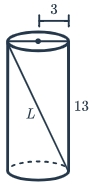

In [8]:

# --- Compute Average Loss over Test Samples ---
total_loss = 0.0
num_samples = 0

for idx in tqdm(range(start_idx, total_samples), desc="Evaluating samples for loss"):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']

    # Prepare inputs for loss computation
    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).to(device, torch.float16)

    # Process target; if list, use first element.
    target = processor(
        text=actual_response if not isinstance(actual_response, list) else actual_response[0],
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).input_ids.to(device)

    # Adjust target length if necessary.
    if target.shape[1] == 512:
        target = target[:, :511]

    inputs["labels"] = target

    with torch.no_grad():
        outputs = model(**inputs)
        total_loss += outputs.loss.item()
        num_samples += 1

average_loss = total_loss / num_samples
print(f"\nAverage Loss over {num_samples} samples (from {start_idx} to end): {average_loss:.4f}")

# --- Random Sample Inference (as before) ---
print("\nRunning inference on a random sample...")
random_idx = random.randint(0, total_samples - 1)
sample = dataset[random_idx]
image = sample['image']
query = sample['query']
actual_response = sample['response']

inputs = processor(
    images=image,
    text=query,
    return_tensors="pt",
).to(device, torch.float16)

if 'qformer_input_ids' not in inputs:
    inputs['qformer_input_ids'] = inputs.input_ids.clone()
if 'qformer_attention_mask' not in inputs:
    inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

with torch.no_grad():
    generated_ids = model.generate(
        pixel_values=inputs.pixel_values,
        input_ids=inputs.input_ids,
        attention_mask=inputs.attention_mask,
        qformer_input_ids=inputs.qformer_input_ids,
        qformer_attention_mask=inputs.qformer_attention_mask,
        max_new_tokens=128,
        num_beams=3,
        do_sample=False,
    )

input_length = inputs.input_ids.shape[1]
generated_ids_only = generated_ids[:, input_length:]
generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

print("\n" + "-" * 50)
print(f"INPUT (Query): {query}")
print("-" * 50)
print(f"ACTUAL OUTPUT: {actual_response}")
print("-" * 50)
print(f"GENERATED OUTPUT: {generated_text}")
print("-" * 50)

if isinstance(image, Image.Image):
    display(image)
elif hasattr(image, 'numpy'):
    display(Image.fromarray(image.numpy()))
else:
    print("Image format not recognized.")



Running inference on 10 random samples between 1001 and 1250...

Sample 1 (Index 1186)
--------------------------------------------------
INPUT (Query): where should I put my circle to win the game?
--------------------------------------------------
ACTUAL OUTPUT: ['You should place your circle in the bottom-right corner to win the game.', 'To win the game of Tic-Tac-Toe (Noughts and Crosses), you should place your circle in the middle cell of the board, which is the intersection of the second row from the top and the second column from the left. This way, you will have two circles diagonally from each other, forming the diagonal winning line for circles.']
--------------------------------------------------
GENERATED OUTPUT: center
--------------------------------------------------


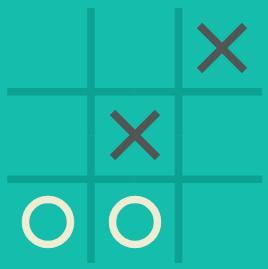


Sample 2 (Index 1020)
--------------------------------------------------
INPUT (Query): How many different kinds of lettuce on the plate?
--------------------------------------------------
ACTUAL OUTPUT: ['In the middle of the picture, there is no lettuce in the white plate, the green vegetable inside is sesame leaf, making this dish more nutritionally balanced.', 'The plate contains several types of lettuce, including green lettuce, curly lettuce, iceberg lettuce, and butter lettuce.']
--------------------------------------------------
GENERATED OUTPUT: There is only one kind of lettuce on the plate.
--------------------------------------------------


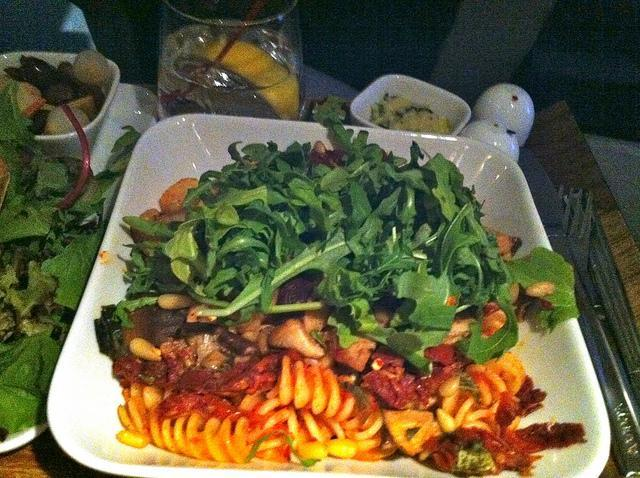


Sample 3 (Index 1100)
--------------------------------------------------
INPUT (Query): Which section's ticket would you recommend I purchase?
--------------------------------------------------
ACTUAL OUTPUT: ['Answer:\n\nBased on the image you provided, it appears to be a seating chart for a stadium. To determine which section\'s ticket you should purchase, consider the following factors:\n\n1. View: Choose a section that offers a clear and unobstructed view of the field.\n2. Comfort: Select a section that is not too far from the field, but also not too close to the action, as this can be distracting.\n3. Price: Compare the prices of the available sections and choose one that fits your budget.\n4. Crowd: If you prefer a quieter atmosphere, consider sections that are not directly behind the goal or in the middle of the crowd.\n\nBased on the image, it looks like the sections labeled "NORTH EAST CORNER 2 ROW 19" and "NORTH EAST CORNER 2 ROW 20" might offer a good balance of view, comfo

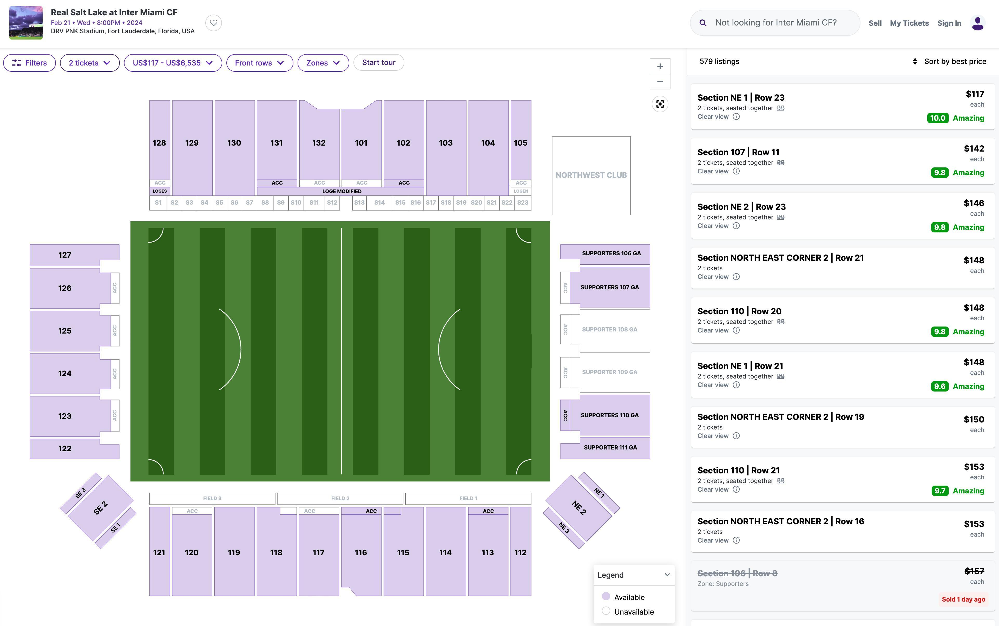


Sample 4 (Index 1087)
--------------------------------------------------
INPUT (Query): What's this
--------------------------------------------------
ACTUAL OUTPUT: ["It's a calculator.", 'The image displays a close-up shot of a smartphone screen, featuring a calculator application focused on the numbers 9, 2, and 9. The calculator is capable of performing scientific calculations, as indicated by the "inv rad sin + cos tan" function visible on the screen. The screen displays a standard calculator with numbers, including the number 9 in the middle of the screen, and scientific functions on the right side of the calculator.']
--------------------------------------------------
GENERATED OUTPUT: image about? The image is a screenshot of a calculator app on a smartphone.
--------------------------------------------------


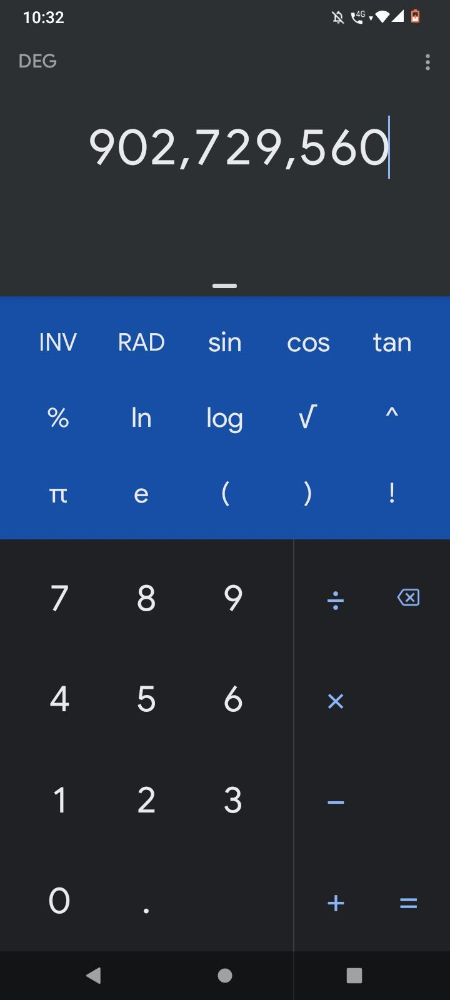


Sample 5 (Index 1008)
--------------------------------------------------
INPUT (Query): What baseball team do these men play for?
--------------------------------------------------
ACTUAL OUTPUT: ['These baseball players are from the Baltimore Orioles team and the Toronto Blue Jays team. The two players are walking and standing next to each other on a baseball field, possibly during a game. The team uniforms are black, white, and orange for the Orioles, and blue, white, and grey for the Blue Jays.', "These baseball players are from the Baltimore Orioles team. The two players are standing next to each other on a baseball field, possibly during a game. The team's representative colors are orange and white."]
--------------------------------------------------
GENERATED OUTPUT: Baltimore Orioles
--------------------------------------------------


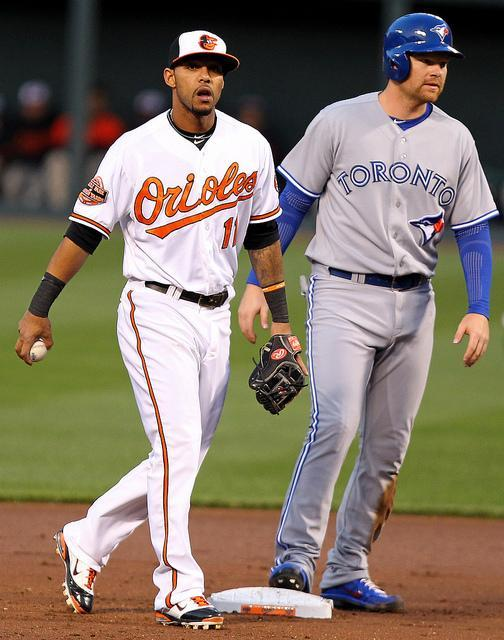


Sample 6 (Index 1028)
--------------------------------------------------
INPUT (Query): Is there any water around the bird in the image?
--------------------------------------------------
ACTUAL OUTPUT: ['No, there is no water near the bird. It is perched on a rock in front of the picture, while looking in the direction to the right of the image.', 'Yes, there is water near the bird, as it perches on a rock in front of the water and also sits on a branch overlooking the water surface.']
--------------------------------------------------
GENERATED OUTPUT: No, there is no water around the bird in the image.
--------------------------------------------------


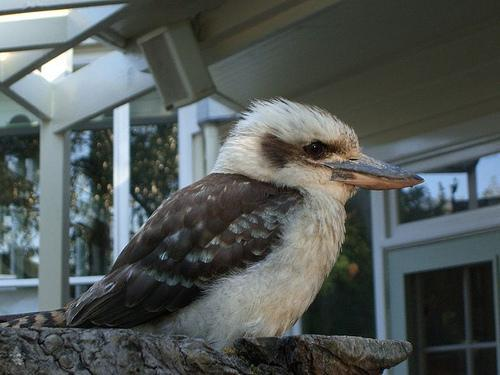


Sample 7 (Index 1026)
--------------------------------------------------
INPUT (Query): What is the color of each pastry?
--------------------------------------------------
ACTUAL OUTPUT: ['In the picture, there are no pastries, but an apple. Since this is a black and white photo, it is impossible to determine its color.', 'The color of the apples in the image is white, and the knife used to cut them is black.']
--------------------------------------------------
GENERATED OUTPUT: The color of each pastry is white with black spots.
--------------------------------------------------


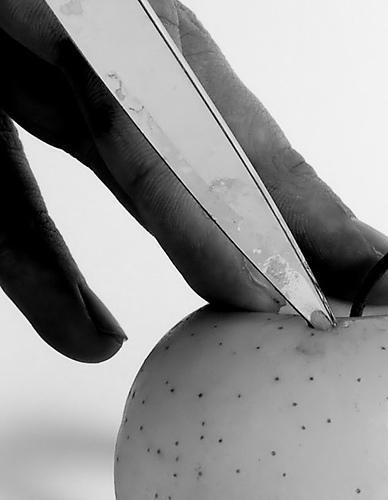


Sample 8 (Index 1169)
--------------------------------------------------
INPUT (Query): what is the disease of the rice leaf, answer only with the disease name
--------------------------------------------------
ACTUAL OUTPUT: ['Brown spot', 'The rice leaf in the image appears to be affected by a disease known as "Green Rust" or "Helminthosporium Blight," which is caused by the fungus Pseudocercosporella fijiensis. This disease can cause significant damage to rice plants.']
--------------------------------------------------
GENERATED OUTPUT: 
--------------------------------------------------


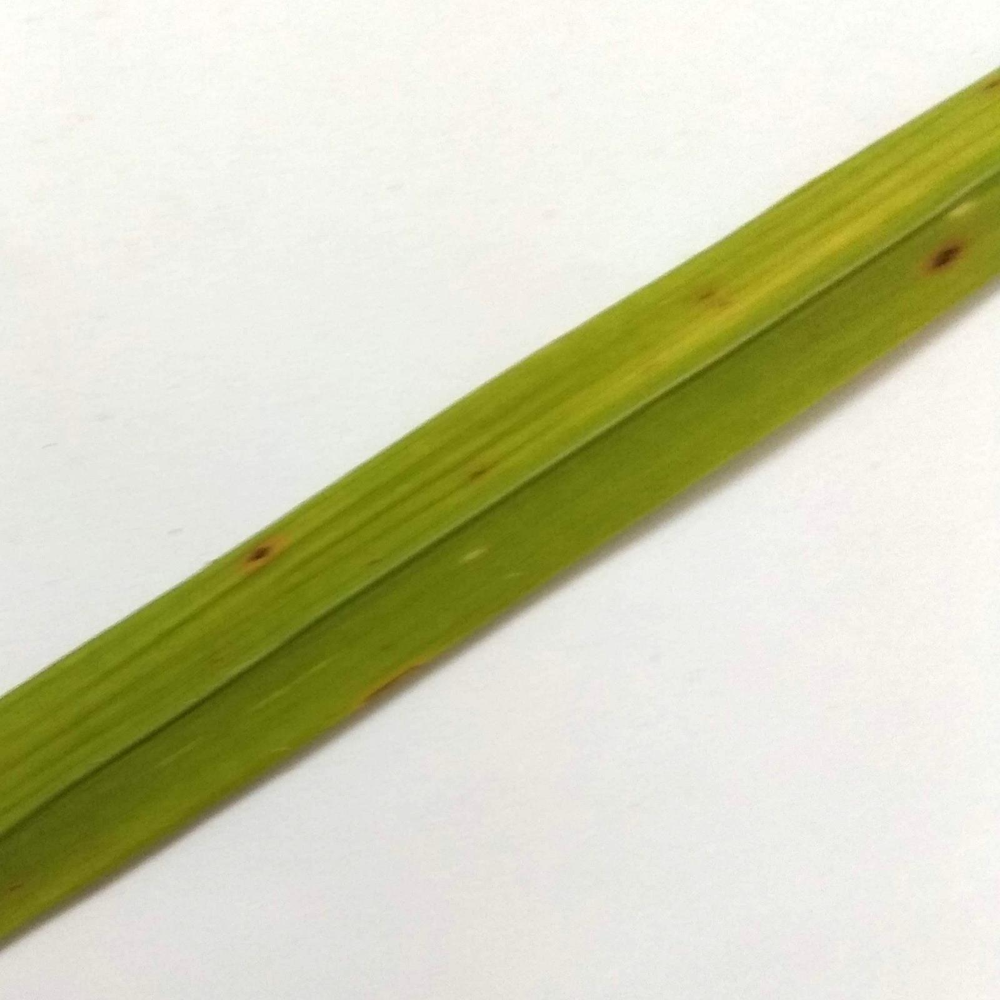


Sample 9 (Index 1135)
--------------------------------------------------
INPUT (Query): Create a caption/description for this image. Mention the image type (photo, oil painting, watercolor painting, illustration, cartoon, drawing, vector, render, etc...) at the beginning of the caption. The caption must intricately describe every part of the image in concrete, objective detail. THINK about what the end goal of the description is, and extrapolate that to what would make satisfying images. The description should be a paragraph of text that is extremely descriptive and detailed, and around 100 words long.
--------------------------------------------------
ACTUAL OUTPUT: ["This image is a digital illustration. The central focus of the image is a large, majestic bird with a wingspan that spans the width of the image. The bird is depicted in a dynamic pose, with its wings spread wide and its head turned to the side, as if it is surveying its surroundings. The bird's feathers are rendered in

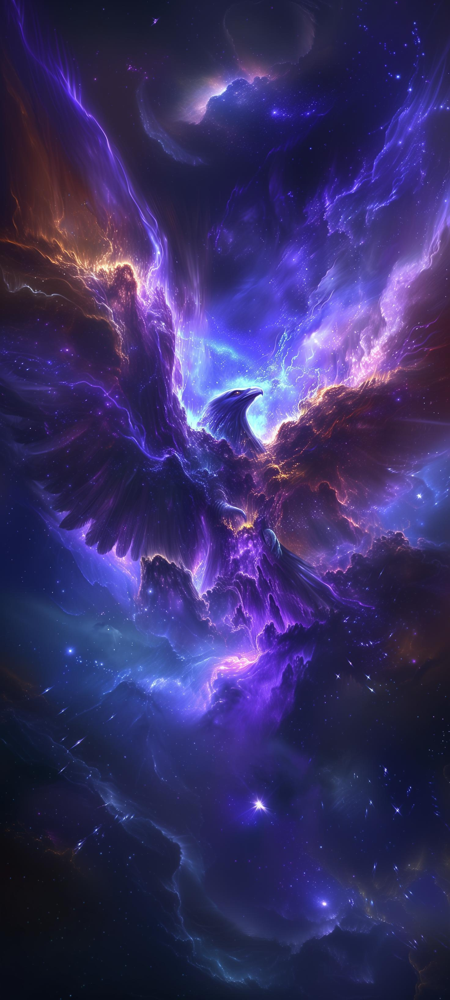


Sample 10 (Index 1138)
--------------------------------------------------
INPUT (Query): What is presented on this image?
--------------------------------------------------
ACTUAL OUTPUT: ['This is a handwritten number seven.', "The image features a black line drawing of a 'X' shape. The drawing is in a simple, black and white style, with a curved, almost vertical line running from the top to the bottom of the image. The image contains no text or additional objects."]
--------------------------------------------------
GENERATED OUTPUT: the number 7 is drawn in black ink
--------------------------------------------------


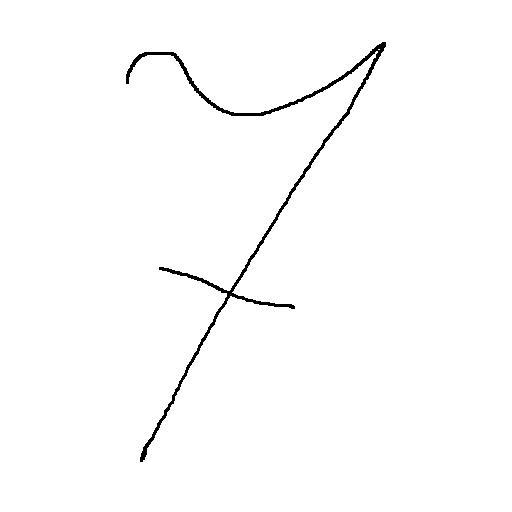

In [9]:
import random

# --- Random Sample Inference (10 random samples between 1001 and 1250) ---
print("\nRunning inference on 10 random samples between 1001 and 1250...")

# Randomly select 10 unique indices between 1001 and 1250
indices = random.sample(range(1001, 1250), 10)

for i, idx in enumerate(indices):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']

    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
    ).to(device, torch.float16)

    if 'qformer_input_ids' not in inputs:
        inputs['qformer_input_ids'] = inputs.input_ids.clone()
    if 'qformer_attention_mask' not in inputs:
        inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            input_ids=inputs.input_ids,
            attention_mask=inputs.attention_mask,
            qformer_input_ids=inputs.qformer_input_ids,
            qformer_attention_mask=inputs.qformer_attention_mask,
            max_new_tokens=128,
            num_beams=3,
            do_sample=False,
        )

    input_length = inputs.input_ids.shape[1]
    generated_ids_only = generated_ids[:, input_length:]
    generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

    print(f"\nSample {i+1} (Index {idx})")
    print("-" * 50)
    print(f"INPUT (Query): {query}")
    print("-" * 50)
    print(f"ACTUAL OUTPUT: {actual_response}")
    print("-" * 50)
    print(f"GENERATED OUTPUT: {generated_text}")
    print("-" * 50)

    if isinstance(image, Image.Image):
        display(image)
    elif hasattr(image, 'numpy'):
        display(Image.fromarray(image.numpy()))
    else:
        print("Image format not recognized.")


In [10]:

# --- Compute Additional Evaluation Metrics (ROUGE and CLIP Score) ---

# Collect predictions for evaluation metrics.
all_generated_texts = []
all_actual_texts = []
all_images = []

print("\nCollecting predictions for evaluation metrics...")
for idx in tqdm(range(start_idx, total_samples), desc="Collecting predictions"):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']
    if isinstance(actual_response, list):
        actual_response = actual_response[0]

    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).to(device, torch.float16)

    if 'qformer_input_ids' not in inputs:
        inputs['qformer_input_ids'] = inputs.input_ids.clone()
    if 'qformer_attention_mask' not in inputs:
        inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            input_ids=inputs.input_ids,
            attention_mask=inputs.attention_mask,
            qformer_input_ids=inputs.qformer_input_ids,
            qformer_attention_mask=inputs.qformer_attention_mask,
            max_new_tokens=128,
            num_beams=3,
            do_sample=False,
        )
    input_length = inputs.input_ids.shape[1]
    generated_ids_only = generated_ids[:, input_length:]
    generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

    all_generated_texts.append(generated_text)
    all_actual_texts.append(actual_response)
    all_images.append(image)

# Compute ROUGE Score using Evaluate.
try:
    rouge_metric = evaluate.load("rouge")
    rouge_result = rouge_metric.compute(predictions=all_generated_texts, references=all_actual_texts)
    print("\nROUGE Evaluation Results:")
    print("ROUGE-1:", rouge_result["rouge1"])
    print("ROUGE-2:", rouge_result["rouge2"])
    print("ROUGE-L:", rouge_result["rougeL"])
except Exception as e:
    print("Error loading or computing ROUGE metric:", e)

# --- Compute CLIP Score using a Custom Function ---
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_tokenizer = clip_processor.tokenizer  # Needed for manual truncation

def truncate_caption(caption, max_tokens=77):
    tokens = clip_tokenizer.encode(caption, truncation=True, max_length=max_tokens, add_special_tokens=True)
    return clip_tokenizer.decode(tokens, skip_special_tokens=True)

def compute_clip_score(image, caption):
    caption = truncate_caption(caption)  # Ensure safe length
    inputs = clip_processor(text=[caption], images=image, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        outputs = clip_model(**inputs)
        # Normalize embeddings
        image_embeds = outputs.image_embeds / outputs.image_embeds.norm(dim=-1, keepdim=True)
        text_embeds = outputs.text_embeds / outputs.text_embeds.norm(dim=-1, keepdim=True)
        # Cosine similarity
        score = (image_embeds @ text_embeds.T).item()
    return score

clip_scores = []
for img, caption in zip(all_images, all_generated_texts):
    try:
        score = compute_clip_score(img, caption)
        clip_scores.append(score)
    except Exception as e:
        print("Error computing CLIP score for a sample:", e)

if clip_scores:
    avg_clip_score = sum(clip_scores) / len(clip_scores)
    print("\nCLIP Score Evaluation Results:")
    print("Average CLIP Score:", avg_clip_score)
else:
    print("CLIP Score could not be computed for the test samples.")


ROUGE Evaluation Results:
ROUGE-1: 0.22823855485730016
ROUGE-2: 0.10443332447630464
ROUGE-L: 0.1931830512356663


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (79 > 77). Running this sequence through the model will result in indexing errors


Error computing CLIP score for a sample: Sequence length must be less than max_position_embeddings (got `sequence length`: 79 and max_position_embeddings: 77

CLIP Score Evaluation Results:
Average CLIP Score: 0.2637866009026766


In [11]:
print("\n🧾 InstructBLIP Evaluation Summary")
print(f"Total Samples Evaluated: {num_samples}")
print(f"Average Loss: {average_loss:.4f}")

print("\n📊 ROUGE Evaluation Results:")
if 'rouge_result' in locals():
    print(f"ROUGE-1: {rouge_result['rouge1']:.4f}")
    print(f"ROUGE-2: {rouge_result['rouge2']:.4f}")
    print(f"ROUGE-L: {rouge_result['rougeL']:.4f}")
else:
    print("ROUGE scores not available.")

print("\n🖼️ CLIP Score Evaluation:")
if clip_scores:
    print(f"Average CLIP Score: {avg_clip_score:.4f}")
else:
    print("CLIP scores not available.")



🧾 InstructBLIP Evaluation Summary
Total Samples Evaluated: 249
Average Loss: 3.2548

📊 ROUGE Evaluation Results:
ROUGE-1: 0.2282
ROUGE-2: 0.1044
ROUGE-L: 0.1932

🖼️ CLIP Score Evaluation:
Average CLIP Score: 0.2638
